## Transition Matrix

In [19]:
from ipynb.fs.full.DBMySQLConnection import getDB, connectDB, getDBDataFrame
import pandas as pd
import plotly.express as px
import dask_ml.cluster
import copy
import math 
import plotly.express as px
import numpy as np
import holoviews as hv
from holoviews import dim, opts
from holoviews import dim, opts
import os 
from sklearn.feature_selection import VarianceThreshold

In [20]:
listStates = ['C','C#','C#dim','C#m','Cdim','Cm','D','D#','D#dim','D#m','Ddim','Dm','E','Edim','Em','F','F#','F#dim','F#m','Fdim','Fm','G','G#', 'G#dim','G#m','Gdim', 'Gm', 'A', 'A#','A#dim','A#m','Adim','Am','B','Bdim','Bm']
df = getDBDataFrame("""
select cct.id_chord, cct.id_track,cc.chords, cc.orig_key
from clean_chords_tracks as cct
inner join clean_chords as cc
        on cc.id = cct.id_chord
""")

MySQL cn is closed


### Importing coldplay songs

In [21]:
coldplaySongs = pd.read_csv('./data/coldplaySongs.csv')

In [22]:
coldplaySongs = coldplaySongs.iloc[:, 1:]

df = pd.concat([coldplaySongs, df])

___

In [23]:
df.head()

,id_chord,id_track,chords,orig_key
0,5000001,Coldplay - The Scientist (Acoustic Cover) (128...,"Am,F,C,G,Am,F,C,G,Am,F,C,G,Am,F,C,Am,F,C,Am,F,...",E
1,5000002,Coldplay - The Scientist (Cello & Piano) - Bro...,"Am,F,C,Am,F,C,F,C,F,C,F,C,F,C,F,C,F,C,G,Bdim,C...",F
2,5000003,Coldplay - The Scientist (Live in Madrid 2011)...,"Am,F,C,G,Am,F,C,G,Am,F,C,G,Am,F,C,Am,F,C,Am,F,...",F
3,5000004,Coldplay - The Scientist (Official Video) (152...,"Am,F,C,Am,F,C,Am,F,C,Am,F,C,F,C,F,C,G,G,C,F,C,...",F
4,5000005,Coldplay - The Scientist (Piano Cover) (152kbi...,"E,Bm,C,G,Em,C,G,C,G,C,G,C,G,Em,G,C,G,F#m,C,G,B...",A#


In [24]:
len(listStates)

36

## Doing some cleaning
checking chords that have a length less than 10

In [25]:
minNumChordProgressions = 10
indexToDrop = df[df.apply(lambda x: len(x['chords'].split(',')) < minNumChordProgressions, axis=1)].index

In [26]:
indexToDrop

Int64Index([232, 831], dtype='int64')

In [27]:
df.drop(indexToDrop, axis=0, inplace=True)

In [28]:
df.head()

,id_chord,id_track,chords,orig_key
0,5000001,Coldplay - The Scientist (Acoustic Cover) (128...,"Am,F,C,G,Am,F,C,G,Am,F,C,G,Am,F,C,Am,F,C,Am,F,...",E
1,5000002,Coldplay - The Scientist (Cello & Piano) - Bro...,"Am,F,C,Am,F,C,F,C,F,C,F,C,F,C,F,C,F,C,G,Bdim,C...",F
2,5000003,Coldplay - The Scientist (Live in Madrid 2011)...,"Am,F,C,G,Am,F,C,G,Am,F,C,G,Am,F,C,Am,F,C,Am,F,...",F
3,5000004,Coldplay - The Scientist (Official Video) (152...,"Am,F,C,Am,F,C,Am,F,C,Am,F,C,F,C,F,C,G,G,C,F,C,...",F
4,5000005,Coldplay - The Scientist (Piano Cover) (152kbi...,"E,Bm,C,G,Em,C,G,C,G,C,G,C,G,Em,G,C,G,F#m,C,G,B...",A#


In [29]:
def getChordsIndexMap(listStates):
    chordsIndex = {}
    index = 0
    for state in listStates:
        chordsIndex[state] = index
        index += 1
    return chordsIndex

def createEmptyStateMatrix(states):
    num_states = len(states)
    trans_mat = np.zeros((num_states, num_states))
    return trans_mat

# Right now this transition matrix is counting transitions among same chords
def createTransitionMatrix2D(chords, states):
    chordsIndex = getChordsIndexMap(states)
    matrix = createEmptyStateMatrix(states)
    totalTrans = 0
    equalChordsTrans = 0
    
    listChords = chords.split(',')
    for i, chord in enumerate(listChords):
        ## there is a next element        
        if ((i + 1)  <  len(listChords)):
            
#             # Not counting transitions among same chords
#             if(chord != listChords[i+1]):
            indexCurrentChord = chordsIndex[chord]
            indexNextChord = chordsIndex[listChords[i+1]]
            matrix[indexCurrentChord][indexNextChord] += 1
            totalTrans += 1
            if (chord == listChords[i+1]):
                equalChordsTrans += 1
            
    return matrix, totalTrans, equalChordsTrans

def getSongTransitionsNormalized(idSongChord, chords, listStates):
    filledMatrix, totalTrans, equalChordsTrans = createTransitionMatrix2D(chords, listStates)
    
    # TESTING....
    #     print('creating trans.. matrix', idSongChord, filledMatrix)
    #     mf = pd.DataFrame(filledMatrix, columns = listStates)
    #     os.makedirs('./data', exist_ok=True)  
    #     mf.to_csv('./data/202646.csv')

    # applying normalization by dividing num of chord transitions divided by the total of transitions\    
#     m = np.matrix(filledMatrix.tolist()) / totalTrans
    m = np.matrix(filledMatrix.tolist())
    flatMatrix = m.flatten().tolist()[0]
    flatMatrix.insert(0, idSongChord)
    return flatMatrix

def generateTransDFForAllSongs(df, listStates):
    numStates  = len(listStates) * len(listStates)
    dfTransMatrix = pd.DataFrame(columns=['id', *range(0, numStates)])

    for i in range(0, len(df)):
        song = df.iloc[i,:]
        idSong = song['id_chord']
        chords = song['chords']
        vectorTransSong = getSongTransitionsNormalized(idSong, chords, listStates)

        # appending chord progressions
        dfTransMatrix.loc[len(dfTransMatrix)] = vectorTransSong

    return dfTransMatrix

def createKeyPairChords(listStates):
    keyPairsChords = []

    for chord1 in listStates:
        for chord2 in listStates:
            keyPairsChords.append(chord1 + ',' + chord2)
            
    return keyPairsChords

### Example: creating of transition matrix from chord progressions

In [13]:
example = 'C,F,G,Am,F,C,C,C,F,C,G,Am,F,C,C,C,F,C,G,Am,F,C,C,C,F,C,G,Am,F,C,Am,F,D,F,Am,F,Am,G,C,C,F,C,G,Am,F,C,C,C,F,C,G#dim,Am,F,F,C,C,C,C,F,C,G,Am,F,C,C,C,F,C,G,Am,F,C,Am,F,D,F,Am,F,Am,G,C,C,F,C,G,Am,F,C,C,C,F,C,G#dim,Am,F,C,Dm,F,C,Dm,F,A#,G,C,C,F,C,G,Am,F,C,C,C,F,C,G,Am,F,C,C,C,F,C,G,Am,F,C,C,C,F,C,G#dim,Am,F,C,C,C,F,C,G,Am,F,C,C,C,F,C,G#dim,Am,F,C,F#m,Am,F,F'
idSongChord = 828282
filledMatrix, totalTrans, equalChordsTrans = createTransitionMatrix2D(example, listStates)
# applying normalization by dividing num of chord transitions divided by the total of transitions
m = np.matrix(filledMatrix.tolist()) / totalTrans
flatMatrix = m.flatten().tolist()[0]
flatMatrix.insert(0, idSongChord)
flatMatrix

[828282,
 0.18181818181818182,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.012987012987012988,
 0.0,
 0.0,
 0.0,
 0.1038961038961039,
 0.0,
 0.0,
 0.006493506493506494,
 0.0,
 0.0,
 0.07142857142857142,
 0.0,
 0.025974025974025976,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.012987012987012988,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,


### Doing some Analysis

In [31]:
createEmptyStateMatrix(listStates)

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

### [DATA UNDERSTANDING 2 CHORD TRANSITION] Checking Dispersion

In [33]:
keyPairsChrods = []
for keyPair1 in listStates:
    for keyPair2 in listStates:
        keyPairsChrods.append(keyPair1 + ',' + keyPair2)

In [34]:
keyPairsChrods[0:5]

['C,C', 'C,C#', 'C,C#dim', 'C,C#m', 'C,Cdim']

In [35]:
totalKeyPairsChords  = len(keyPairsChrods)
print('Total amount key value pairs: ', len(keyPairsChrods))

Total amount key value pairs:  1296


### ::: Generating Chord progressions for all songs ::

The error that is throwing is probably because there is no transitions in a song, cleaning steps need to be performed

In [30]:
dfTransMatrix = generateTransDFForAllSongs(df, listStates)

In [31]:
dfTransMatrix.head(1)

,id,0,1,2,3,4,5,6,7,8,...,1286,1287,1288,1289,1290,1291,1292,1293,1294,1295
0,5000001.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [16]:
onlyChords = dfTransMatrix.iloc[:,1:]
totalTransMatrixColumns = len(dfTransMatrix.iloc[:,1:].columns)
print('Total Amount of columns', totalTransMatrixColumns)
assert totalTransMatrixColumns == totalKeyPairsChords

Total Amount of columns 1296


NameError: name 'totalKeyPairsChords' is not defined

In [ ]:
onlyChords.columns = keyPairsChrods

In [ ]:
onlyChords

In [ ]:
cat = pd.DataFrame({'chords':onlyChords.sum().index.tolist(), 'count':onlyChords.sum().values.tolist()})
cat = cat[cat['count'] > 0]
cat = cat.sort_values(by='count', ascending=False)

## Doing some Analysis

***Chord pair transitions taking percentages not normalized (Not trustable approach)***

In [ ]:
fig = px.bar(cat, x='chords', y='count', title='Test', template='plotly_white')
#     fig = px.bar(cat, x='chords', y='count', title=titleLabel, marker = [color = 'green')


fig.show()

In [115]:
onlyChords

,"C,C","C,C#","C,C#dim","C,C#m","C,Cdim","C,Cm","C,D","C,D#","C,D#dim","C,D#m",...,"Bm,Gm","Bm,A","Bm,A#","Bm,A#dim","Bm,A#m","Bm,Adim","Bm,Am","Bm,B","Bm,Bdim","Bm,Bm"
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3477,12.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3478,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3479,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3480,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [116]:
normalizedCountChordTrans = onlyChords.applymap(lambda x: 1 if x > 0 else 0)

In [117]:
cat = pd.DataFrame({'chords':normalizedCountChordTrans.sum().index.tolist(), 'count':normalizedCountChordTrans.sum().values.tolist()})


In [118]:
len(cat)

1296

In [119]:
cat[cat['count'] == 0]

,chords,count
3,"C,C#m",0
10,"C,Ddim",0
24,"C,G#m",0
25,"C,Gdim",0
31,"C,Adim",0
...,...,...
1284,"Bm,G#m",0
1285,"Bm,Gdim",0
1289,"Bm,A#dim",0
1291,"Bm,Adim",0


In [120]:
cat[cat['count'] > 0]

,chords,count
0,"C,C",1528
1,"C,C#",32
2,"C,C#dim",8
4,"C,Cdim",2
5,"C,Cm",33
...,...,...
1288,"Bm,A#",1
1290,"Bm,A#m",1
1292,"Bm,Am",20
1294,"Bm,Bdim",1


In [121]:
cat = cat[cat['count'] > 200]
cat = cat.sort_values(by='count', ascending=False)

In [122]:
len(cat)

47

In [123]:
cat.head(10).sort_values(by='count', ascending=False)['count'].sum() / 10

1853.5

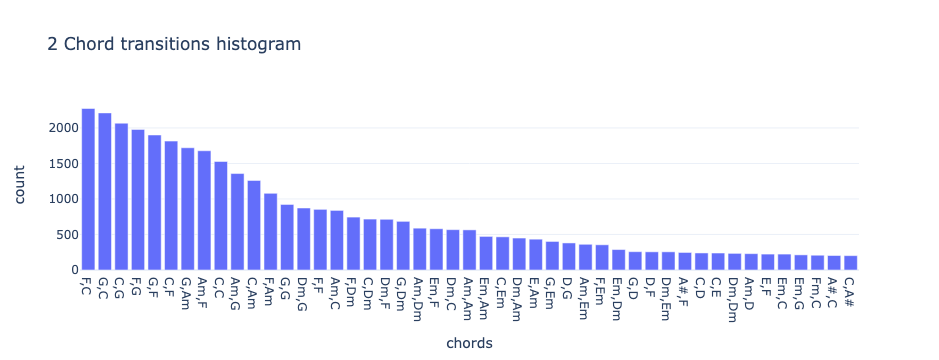

In [124]:
fig = px.bar(cat, x='chords', y='count', title='2 Chord transitions histogram', template='plotly_white')
#     fig = px.bar(cat, x='chords', y='count', title=titleLabel, marker = [color = 'green')


fig.show()

## Removing features with low variance

***Deleting transitions with standard deviation of 0***

In [36]:
indexesToDelete = dfTransMatrix.loc[:, dfTransMatrix.std() == 0].columns.tolist()
print(list(map(lambda x: keyPairsChrods[x], indexesToDelete)))

['C,C#m', 'C,Ddim', 'C,G#m', 'C,Gdim', 'C,Adim', 'C#,C#dim', 'C#,Cdim', 'C#,D#dim', 'C#,Ddim', 'C#,E', 'C#,Edim', 'C#,F#dim', 'C#,Fdim', 'C#,G#dim', 'C#,Gdim', 'C#,A#dim', 'C#,Adim', 'C#,Am', 'C#,Bdim', 'C#dim,C#', 'C#dim,C#m', 'C#dim,Cdim', 'C#dim,Cm', 'C#dim,D#', 'C#dim,D#dim', 'C#dim,D#m', 'C#dim,Ddim', 'C#dim,E', 'C#dim,Edim', 'C#dim,Em', 'C#dim,F#', 'C#dim,F#dim', 'C#dim,F#m', 'C#dim,Fdim', 'C#dim,Fm', 'C#dim,G#', 'C#dim,G#dim', 'C#dim,G#m', 'C#dim,Gdim', 'C#dim,Gm', 'C#dim,A#', 'C#dim,A#dim', 'C#dim,A#m', 'C#dim,Adim', 'C#dim,Am', 'C#dim,B', 'C#dim,Bdim', 'C#dim,Bm', 'C#m,C#', 'C#m,C#dim', 'C#m,Cdim', 'C#m,D#', 'C#m,D#dim', 'C#m,D#m', 'C#m,Ddim', 'C#m,Edim', 'C#m,Em', 'C#m,F#dim', 'C#m,Fdim', 'C#m,Fm', 'C#m,G#', 'C#m,G#dim', 'C#m,Gdim', 'C#m,Gm', 'C#m,A#', 'C#m,A#dim', 'C#m,A#m', 'C#m,Adim', 'C#m,Bdim', 'Cdim,C#', 'Cdim,C#dim', 'Cdim,C#m', 'Cdim,Cdim', 'Cdim,Cm', 'Cdim,D', 'Cdim,D#', 'Cdim,D#dim', 'Cdim,D#m', 'Cdim,Ddim', 'Cdim,Edim', 'Cdim,Em', 'Cdim,F#', 'Cdim,F#dim', 'Cdim,F#m

In [37]:
len(dfTransMatrix.loc[:, dfTransMatrix.std() > 0].columns)

664

***Columns with standard deviation of 0***

In [38]:
keyPairsChords =  createKeyPairChords(listStates)
listUnusedTransitions = dfTransMatrix.loc[:, dfTransMatrix.std() == 0].columns


result = map(lambda x: x + x, listUnusedTransitions)


In [ ]:
s = dfTransMatrix.nunique(axis=0)
len(s[s == 1])

In [ ]:
len(listUnusedTransitions)

***Reduce size of Dataframe excluding columns with 0 variation***

In [39]:
dfTransMatrix = dfTransMatrix.loc[:, dfTransMatrix.loc[:, dfTransMatrix.std() > 0].columns.tolist()]

In [40]:
dfTransMatrix

,id,0,1,2,4,5,6,7,8,9,...,1276,1278,1281,1286,1287,1288,1290,1292,1294,1295
0,5000001.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,5000002.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,5000003.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,5000004.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5000005.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3506,79685.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3507,39828.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3508,957714.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3509,1172824.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


***Saving transition matrices calculation, (normalized)***

In [41]:
os.makedirs('./data', exist_ok=True)  
dfTransMatrix.to_csv('./data/transitionMatricesNotNormalized.csv')

In [42]:
dfTransMatrix.head()

,id,0,1,2,4,5,6,7,8,9,...,1276,1278,1281,1286,1287,1288,1290,1292,1294,1295
0,5000001.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,5000002.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,5000003.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,5000004.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5000005.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<hr><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br><br>

## Testing KMeans Draft not official.
___

In [58]:
dfTransMatrix[dfTransMatrix.isna().any(axis=1)]

,id,0,1,2,4,5,6,7,8,9,...,1276,1278,1281,1286,1287,1288,1290,1292,1294,1295


In [59]:
df = dfTransMatrix.iloc[:, 1:]
X = df.values.tolist()

In [60]:
X 

[[0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.26881720430107525,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.

### Scaling is not needed at this point since we are only interacting with chords progressions which follow the same metric across all of them 

Difference btw scaling and normalizing can be found [here](https://www.kaggle.com/code/rtatman/data-cleaning-challenge-scale-and-normalize-data/notebook)

In [24]:
numClusters = 8

km = dask_ml.cluster.KMeans(n_clusters=numClusters)
labels = km.fit(X)

In [25]:
labels

KMeans()

In [26]:
## Concatenating the labels into the dataset 
labels = list(km.labels_.compute())
df['category'] = labels

In [27]:
[df.isnull()]

[          0      1      2      4      5      6      7      8      9     11  \
 0     False  False  False  False  False  False  False  False  False  False   
 1     False  False  False  False  False  False  False  False  False  False   
 2     False  False  False  False  False  False  False  False  False  False   
 3     False  False  False  False  False  False  False  False  False  False   
 4     False  False  False  False  False  False  False  False  False  False   
 ...     ...    ...    ...    ...    ...    ...    ...    ...    ...    ...   
 3477  False  False  False  False  False  False  False  False  False  False   
 3478  False  False  False  False  False  False  False  False  False  False   
 3479  False  False  False  False  False  False  False  False  False  False   
 3480  False  False  False  False  False  False  False  False  False  False   
 3481  False  False  False  False  False  False  False  False  False  False   
 
       ...   1278   1281   1286   1287   1288   12

In [28]:
np.random.random((50,50))

array([[0.33875088, 0.60899663, 0.9479446 , ..., 0.48610818, 0.07981562,
        0.37391736],
       [0.23797893, 0.42105668, 0.40410257, ..., 0.14307723, 0.38375551,
        0.34321518],
       [0.23418434, 0.1913448 , 0.26041438, ..., 0.02900799, 0.56467935,
        0.08807647],
       ...,
       [0.13775509, 0.62267073, 0.97462952, ..., 0.59835777, 0.31646025,
        0.76750675],
       [0.737103  , 0.39122039, 0.78451091, ..., 0.93505579, 0.02715549,
        0.92083259],
       [0.82380641, 0.67877447, 0.36762579, ..., 0.96759928, 0.84849526,
        0.52991189]])

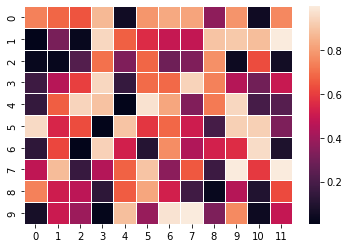

In [29]:
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt

uniform_data = np.random.rand(10, 12)
ax = sns.heatmap(uniform_data, linewidth=0.5)
plt.show()

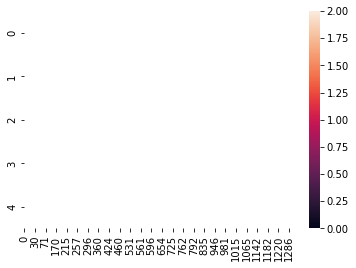

In [30]:

ax = sns.heatmap(df.head(), linewidth=0.5)
plt.show()

In [31]:
len(df.row)

AttributeError: 'DataFrame' object has no attribute 'row'

In [ ]:
df.shape

In [ ]:
df.iloc[1,:]['id']

In [ ]:
len(df)

In [ ]:
X

In [ ]:
df.head()

In [ ]:
# cretate key pairs transitions
keyPairsChords = []

for a in listStates:
    for b in listStates:
        keyPairsChords.append(a + ',' + b)
len(keyPairsChords)

In [ ]:

m = createEmptyStateMatrix(listStates)

In [ ]:
m

In [ ]:
chordsIndex = getChordsIndexMap(listStates)

In [ ]:
def createLinksFromTransMatrix(matrix, listStates):
    links = []

    for i, row in enumerate(matrix):
        for j,col in enumerate(row):

            source = listStates[i]
            target = listStates[j]
            value = matrix[i][j]
            if(value != 0 and (source != target)):
#                 links.append({  'si': i , 'source': source, 'it': j,'target': target, 'value': value })    

                links.append({ 'source': i, 'target': j, 'value': value })    
    return pd.DataFrame(links)
        

In [ ]:
links = createLinksFromTransMatrix(filledMatrix, listStates)
links

In [ ]:
links = links.head(2)

In [ ]:
links

In [ ]:
hv.Chord(links)

<!DOCTYPE html>
<meta charset="utf-8">

<!-- Load d3.js -->
<script src="https://d3js.org/d3.v4.js"></script>

<!-- Create a div where the graph will take place -->
<div id="my_dataviz"></div>


In [ ]:
listNodes = []
for i, key in enumerate(listStates):
    listNodes.append({ 'index': i, 'name': key })

In [ ]:
nodes = hv.Dataset(pd.DataFrame(listNodes), 'index')

In [ ]:
nodes.data

In [ ]:
hv.Chord((links, nodes)).opts(
    opts.Chord(cmap='Category20', edge_color=dim('source').astype(str), labels='name', node_color=dim('index').astype(str)))

In [ ]:
m[24][24]

In [ ]:
listStates

In [ ]:

chordDiagram(filledMatrix)

In [ ]:
dfObj = pd.DataFrame(columns=['source', 'target', 'value'])
dfObj

In [ ]:
len(example.split(','))

In [ ]:
len(listStates)

In [ ]:
states = getDBDataFrame("""
    SELECT *
    from states
""")

In [ ]:
len(trans_mat)

In [ ]:
len(listKeys)

In [ ]:
import seaborn as sns
import pandas as pd
import numpy as np

# Create a dataset
df = pd.DataFrame(filledMatrix, columns=listStates)

# Default heatmap
p1 = sns.heatmap(df)

In [ ]:
df_norm_col=(df-df.mean())/df.std()

In [ ]:
import matplotlib.pyplot as plt
sns.heatmap(df_norm_col, cmap='viridis')
plt.show()